In [4]:
import os
import tensorflow as tf
import keras_cv
import cv2
import numpy as np
import json
import matplotlib.pyplot as plt

Load data

In [2]:

print("TF version:", tf.__version__)
print("GPUs:", tf.config.list_physical_devices('GPU'))


def load_coco_dataset(images_dir, annotations_file):
    with open(annotations_file, 'r', encoding='utf-8') as f:
        coco = json.load(f)

    img_id_to_filename = {img['id']: img['file_name'] for img in coco['images']}

    dataset_list = []
    for ann in coco['annotations']:
        img_filename = img_id_to_filename[ann['image_id']]
        img_path = os.path.join(images_dir, img_filename)
        dataset_list.append({
            'image_path': img_path,
            'bbox': ann['bbox'],  # [x, y, width, height]
            'category_id': ann['category_id']
        })
    return dataset_list

base_path = r"C:\Users\Lenovo\OneDrive\Desktop\project4_CV\computer-vision-project-mawqif\Dataset"

train_dataset_list = load_coco_dataset(
    os.path.join(base_path, "train"),
    os.path.join(base_path, "train", "_annotations.coco.json")
)

val_dataset_list = load_coco_dataset(
    os.path.join(base_path, "valid"),
    os.path.join(base_path, "valid", "_annotations.coco.json")
)

test_dataset_list = load_coco_dataset(
    os.path.join(base_path, "test"),
    os.path.join(base_path, "test", "_annotations.coco.json")
)

print("Train samples:", len(train_dataset_list))
print("Validation samples:", len(val_dataset_list))
print("Test samples:", len(test_dataset_list))


TF version: 2.20.0
GPUs: []
Train samples: 10204
Validation samples: 1854
Test samples: 499


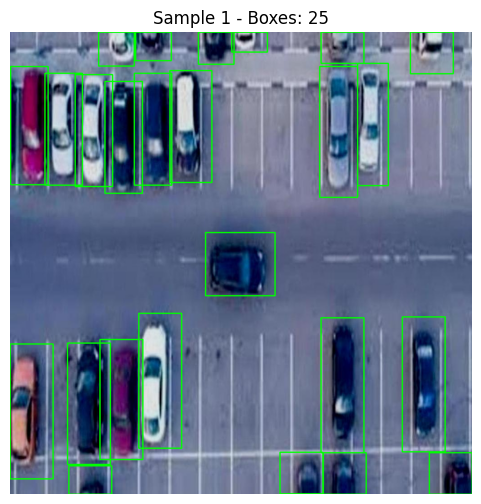

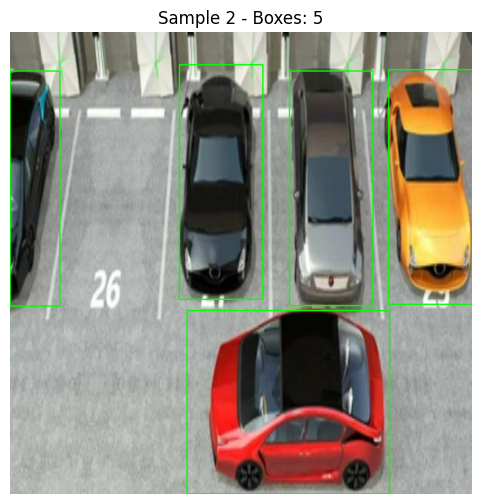

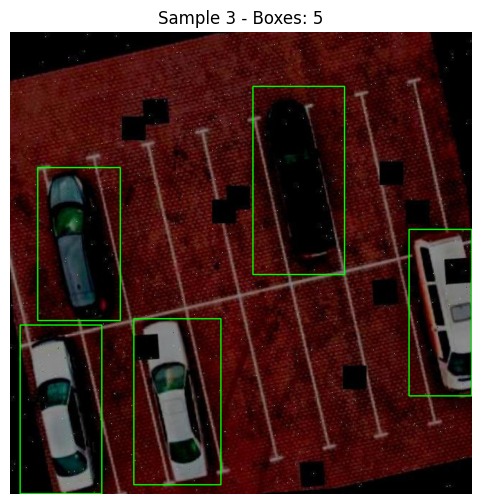

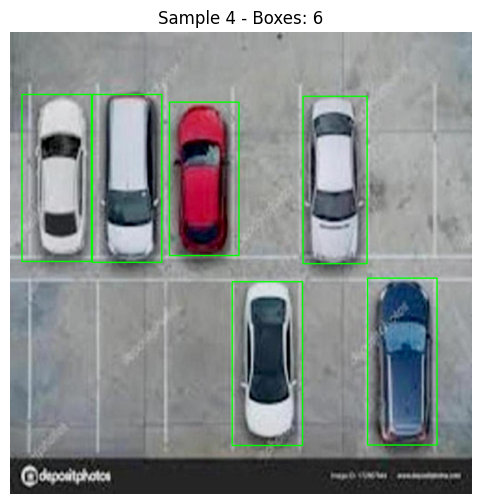

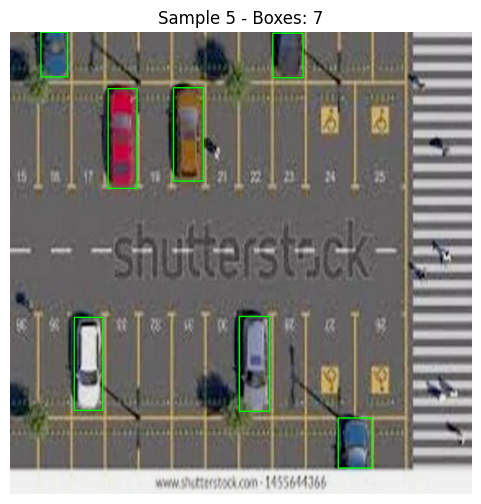

In [5]:

def load_coco_dataset_all_boxes(images_dir, annotations_file):
    with open(annotations_file, 'r', encoding='utf-8') as f:
        coco = json.load(f)

    img_id_to_filename = {img['id']: img['file_name'] for img in coco['images']}

    dataset_dict = {}
    for ann in coco['annotations']:
        img_filename = img_id_to_filename[ann['image_id']]
        if img_filename not in dataset_dict:
            dataset_dict[img_filename] = []
        dataset_dict[img_filename].append({
            'bbox': ann['bbox'], 
            'category_id': ann['category_id']
        })
    return dataset_dict

train_dataset_dict = load_coco_dataset_all_boxes(
    os.path.join(base_path, "train"),
    os.path.join(base_path, "train", "_annotations.coco.json")
)

for i, (img_name, boxes) in enumerate(list(train_dataset_dict.items())[:5]):
    img_path = os.path.join(base_path, "train", img_name)
    img = cv2.imread(img_path)
    for box in boxes:
        x, y, w, h = box['bbox']
        cv2.rectangle(img, (int(x), int(y)), (int(x+w), int(y+h)), (0, 255, 0), 2)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6,6))
    plt.imshow(img_rgb)
    plt.title(f"Sample {i+1} - Boxes: {len(boxes)}")
    plt.axis('off')
    plt.show()

In [ ]:
import cv2
import numpy as np
import torch
import torchvision
from torchvision import transforms
import matplotlib.pyplot as plt


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


def get_model(num_classes=2):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
        in_features, num_classes
    )
    return model

MODEL_PATH = "faster_rcnn_car.pth"

model = get_model(num_classes=2)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
model.eval()


Using device: cpu


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

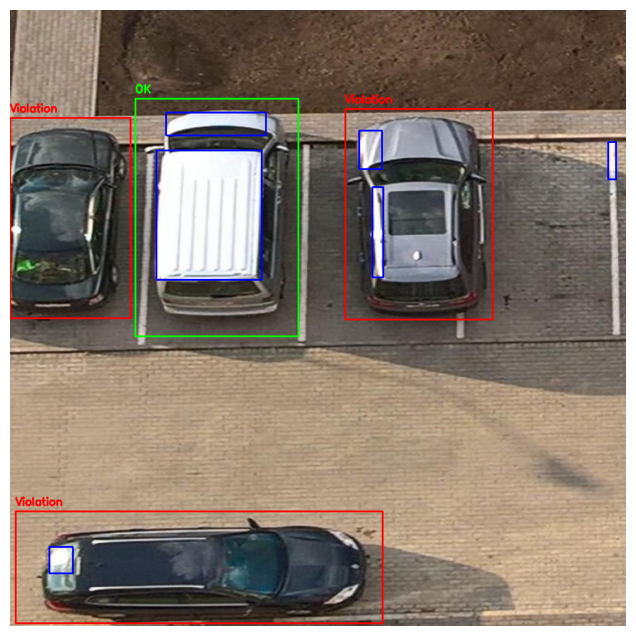

In [23]:

# 1.Segmentation

def detect_parking_spots_segmentation(img, draw=True):
   
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    
    _, thresh = cv2.threshold(blur, 200, 255, cv2.THRESH_BINARY)
    
    kernel = np.ones((5,5), np.uint8)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)

    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    parking_rects = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        if w*h > 500:
            parking_rects.append([x, y, x+w, y+h])
            if draw:
                cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
    return parking_rects, img


image_path = "testImg.jpg"
img = cv2.imread(image_path)
img_copy = img.copy()

transform = transforms.ToTensor()
input_tensor = transform(img_copy).unsqueeze(0).to(device)

with torch.no_grad():
    outputs = model(input_tensor)[0]

boxes = outputs["boxes"].detach().cpu().numpy()
scores = outputs["scores"].detach().cpu().numpy()
car_boxes = [box for box, score in zip(boxes, scores) if score > 0.5]


parking_rects, img_with_lines = detect_parking_spots_segmentation(img_copy)

# (Intersection over Box)
def intersection_over_area(box, rect):
    x1 = max(box[0], rect[0])
    y1 = max(box[1], rect[1])
    x2 = min(box[2], rect[2])
    y2 = min(box[3], rect[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box_area = (box[2] - box[0]) * (box[3] - box[1])

    if box_area == 0:
        return 0
    return inter_area / box_area  # نسبة التداخل



for box in car_boxes:
    x1, y1, x2, y2 = map(int, box)
    violation = True 
    

    for rect in parking_rects:
        iou_ratio = intersection_over_area(box, rect)
        if iou_ratio >= 0.1:
            violation = False
            break

    color = (0, 0, 255) if violation else (0, 255, 0)
    label = "Violation" if violation else "OK"
    cv2.rectangle(img_with_lines, (x1, y1), (x2, y2), color, 2)
    cv2.putText(img_with_lines, label, (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

plt.figure(figsize=(12,8))
plt.imshow(cv2.cvtColor(img_with_lines, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


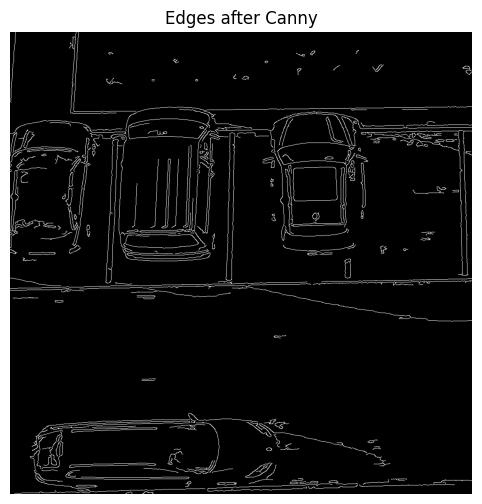

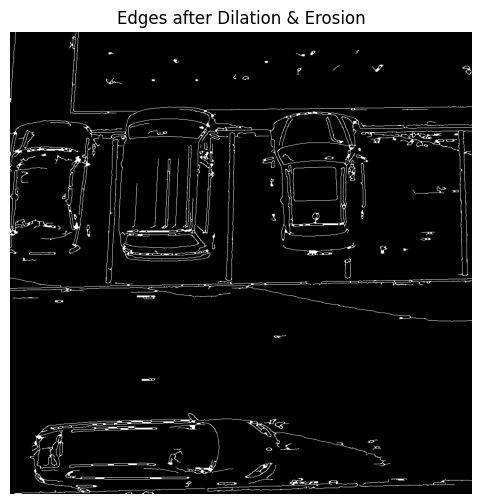

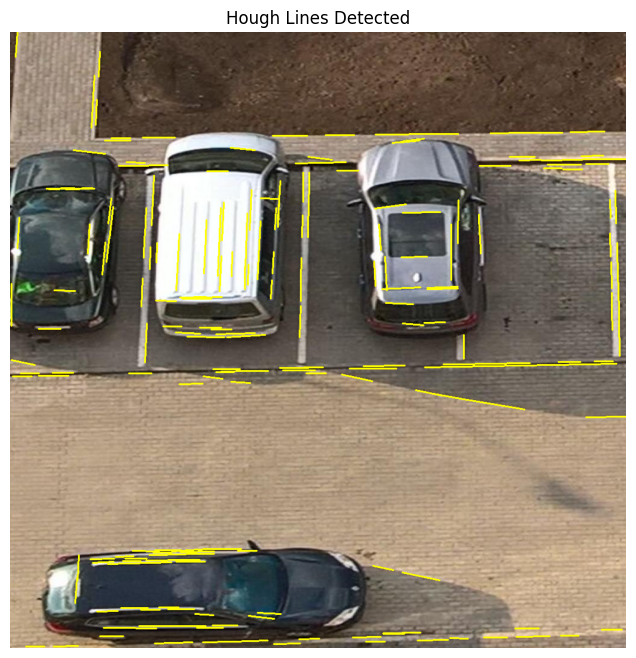

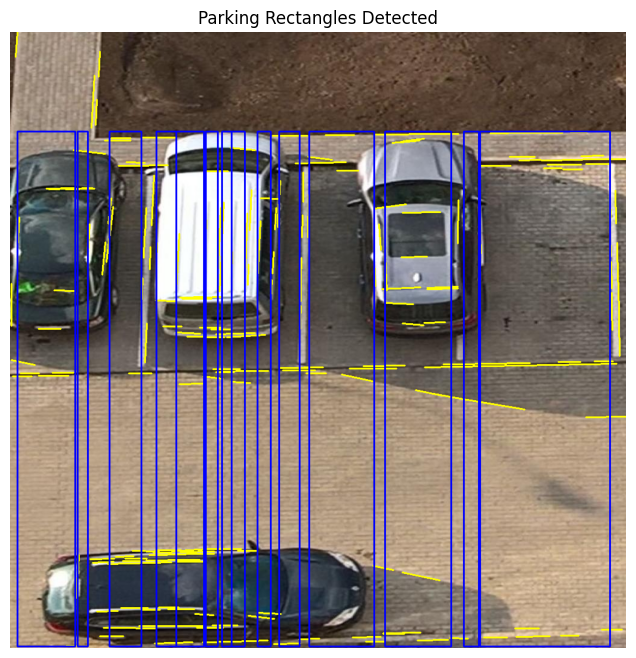


Car 1 Bounding Box: 557,164,802,514
  Parking Spot 1: 12,165,108,1021
  Parking Spot 2: 112,165,129,1021
  Parking Spot 3: 165,165,218,1021
  Parking Spot 4: 243,165,276,1021
  Parking Spot 5: 276,165,322,1021
  Parking Spot 6: 325,165,345,1021
  Parking Spot 7: 352,165,368,1021
  Parking Spot 8: 368,165,390,1021
  Parking Spot 9: 411,165,433,1021
  Parking Spot 10: 447,165,481,1021
  Parking Spot 11: 497,165,605,1021
  Parking Spot 12: 623,165,733,1021
  Parking Spot 13: 754,165,779,1021
  Parking Spot 14: 781,165,997,1021
  Result: Violation


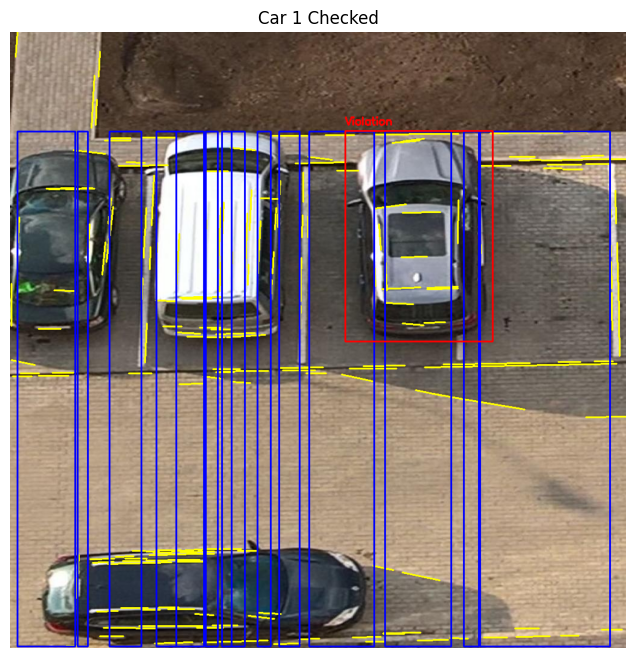


Car 2 Bounding Box: 0,179,200,512
  Parking Spot 1: 12,165,108,1021
  Parking Spot 2: 112,165,129,1021
  Parking Spot 3: 165,165,218,1021
  Parking Spot 4: 243,165,276,1021
  Parking Spot 5: 276,165,322,1021
  Parking Spot 6: 325,165,345,1021
  Parking Spot 7: 352,165,368,1021
  Parking Spot 8: 368,165,390,1021
  Parking Spot 9: 411,165,433,1021
  Parking Spot 10: 447,165,481,1021
  Parking Spot 11: 497,165,605,1021
  Parking Spot 12: 623,165,733,1021
  Parking Spot 13: 754,165,779,1021
  Parking Spot 14: 781,165,997,1021
  Result: Violation


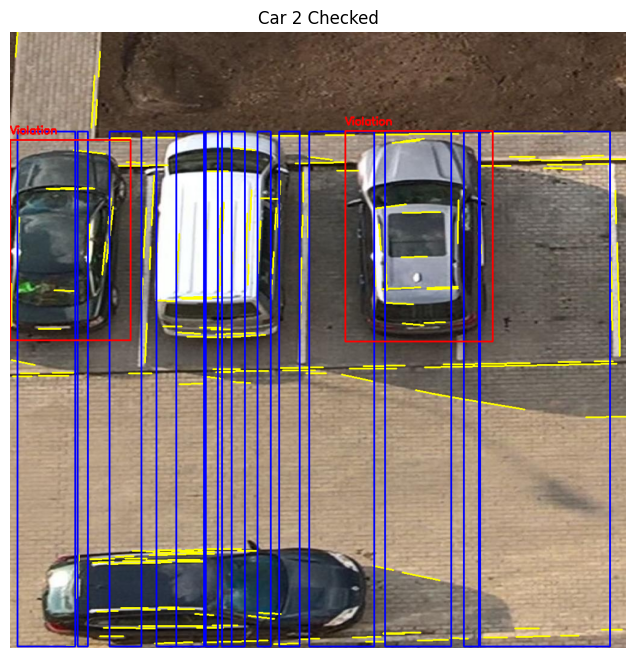


Car 3 Bounding Box: 208,147,479,542
  Parking Spot 1: 12,165,108,1021
  Parking Spot 2: 112,165,129,1021
  Parking Spot 3: 165,165,218,1021
  Parking Spot 4: 243,165,276,1021
  Parking Spot 5: 276,165,322,1021
  Parking Spot 6: 325,165,345,1021
  Parking Spot 7: 352,165,368,1021
  Parking Spot 8: 368,165,390,1021
  Parking Spot 9: 411,165,433,1021
  Parking Spot 10: 447,165,481,1021
  Parking Spot 11: 497,165,605,1021
  Parking Spot 12: 623,165,733,1021
  Parking Spot 13: 754,165,779,1021
  Parking Spot 14: 781,165,997,1021
  Result: Violation


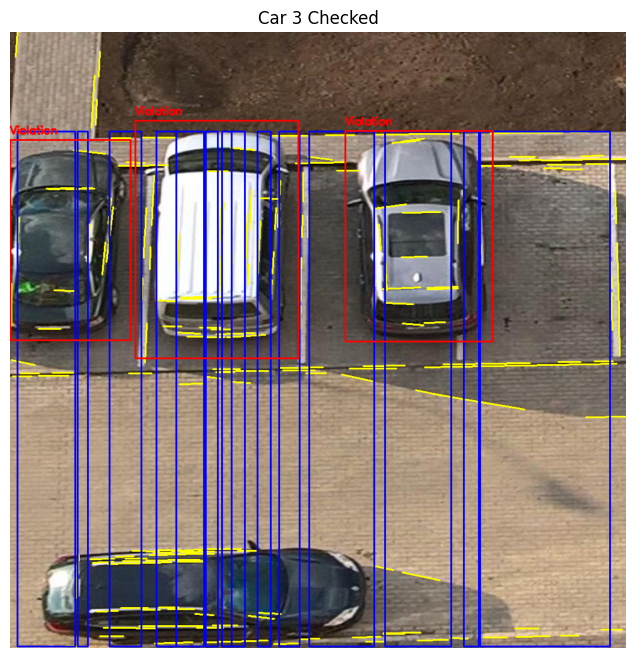


Car 4 Bounding Box: 9,833,619,1019
  Parking Spot 1: 12,165,108,1021
  Parking Spot 2: 112,165,129,1021
  Parking Spot 3: 165,165,218,1021
  Parking Spot 4: 243,165,276,1021
  Parking Spot 5: 276,165,322,1021
  Parking Spot 6: 325,165,345,1021
  Parking Spot 7: 352,165,368,1021
  Parking Spot 8: 368,165,390,1021
  Parking Spot 9: 411,165,433,1021
  Parking Spot 10: 447,165,481,1021
  Parking Spot 11: 497,165,605,1021
  Parking Spot 12: 623,165,733,1021
  Parking Spot 13: 754,165,779,1021
  Parking Spot 14: 781,165,997,1021
  Result: Violation


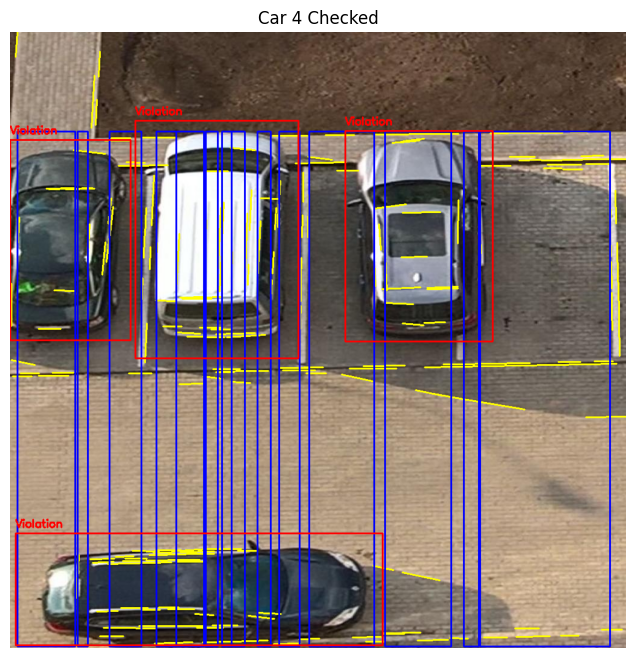

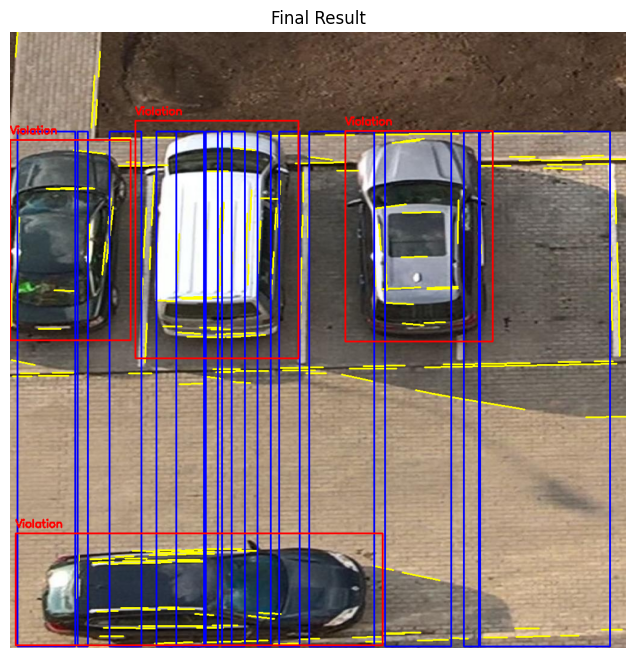

In [ ]:

#Intersection over Box
def intersection_over_area(box, rect):
    x1 = max(box[0], rect[0])
    y1 = max(box[1], rect[1])
    x2 = min(box[2], rect[2])
    y2 = min(box[3], rect[3])

    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box_area = (box[2] - box[0]) * (box[3] - box[1])

    return 0 if box_area == 0 else inter_area / box_area

# Hough

def detect_parking_spots_ground(img, draw=True, use_manual=False, show_steps=True):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edges = cv2.Canny(blur, 50, 150, apertureSize=3)

    if show_steps:
        plt.figure(figsize=(8,6))
        plt.imshow(edges, cmap='gray')
        plt.title("Edges after Canny")
        plt.axis("off")
        plt.show()

    kernel = np.ones((3,3), np.uint8)
    edges = cv2.dilate(edges, kernel, iterations=1)
    edges = cv2.erode(edges, kernel, iterations=1)

    if show_steps:
        plt.figure(figsize=(8,6))
        plt.imshow(edges, cmap='gray')
        plt.title("Edges after Dilation & Erosion")
        plt.axis("off")
        plt.show()

    parking_rects = []

    if not use_manual:
        # Hough Line Detection
        lines = cv2.HoughLinesP(edges, 1, np.pi/180, 50, minLineLength=30, maxLineGap=5)
        vertical_lines, horizontal_lines = [], []
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))
                if abs(angle) < 30:
                    horizontal_lines.append(line[0])
                elif abs(abs(angle)-90) < 30:
                    vertical_lines.append(line[0])
                if draw:
                    cv2.line(img, (x1, y1), (x2, y2), (0,255,255), 2)

        if show_steps and draw:
            plt.figure(figsize=(10,8))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Hough Lines Detected")
            plt.axis("off")
            plt.show()

        if vertical_lines:
            vertical_lines = sorted(vertical_lines, key=lambda l: min(l[0], l[2]))
            for i in range(len(vertical_lines)-1):
                x1 = min(vertical_lines[i][0], vertical_lines[i][2])
                x2 = min(vertical_lines[i+1][0], vertical_lines[i+1][2])
                y1 = min([min(l[1], l[3]) for l in horizontal_lines]) if horizontal_lines else 0
                y2 = max([max(l[1], l[3]) for l in horizontal_lines]) if horizontal_lines else img.shape[0]
                if x2 - x1 > 15:
                    rect = [x1, y1, x2, y2]
                    parking_rects.append(rect)
                    if draw:
                        cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)

        if show_steps and draw:
            plt.figure(figsize=(10,8))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title("Parking Rectangles Detected")
            plt.axis("off")
            plt.show()

    else:
        points = []
        def click_event(event, x, y, flags, param):
            if event == cv2.EVENT_LBUTTONDOWN:
                points.append((x,y))
                cv2.circle(img, (x,y), 5, (0,0,255), -1)
                if len(points) == 4:
                    rect = cv2.boundingRect(np.array(points))
                    parking_rects.append([rect[0], rect[1], rect[0]+rect[2], rect[1]+rect[3]])
                    cv2.rectangle(img, (rect[0], rect[1]), (rect[0]+rect[2], rect[1]+rect[3]), (255,0,0), 2)
                    points.clear()
        cv2.imshow("Select Parking Spots", img)
        cv2.setMouseCallback("Select Parking Spots", click_event)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

    return parking_rects, img


# Check violations with ratio
def check_violations_ratio(img, car_boxes, parking_rects, threshold=0.8, shrink_ratio=0.15, show_steps=True):
    img_step = img.copy()
    for i, box in enumerate(car_boxes):
        box_shrink = shrink_box(box, shrink_ratio)  # shrink box
        x1, y1, x2, y2 = map(int, box_shrink)
        violation = True

        for rect in parking_rects:
            inter_area = intersection_over_area(box_shrink, rect) * ((x2-x1)*(y2-y1))
            car_area = (x2 - x1) * (y2 - y1)
            ratio = inter_area / car_area

            if ratio >= threshold:
                violation = False
                break

        label = "Violation" if violation else "OK"
        color = (0, 0, 255) if violation else (0, 255, 0)
        cv2.rectangle(img_step, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img_step, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        if show_steps:
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(img_step, cv2.COLOR_BGR2RGB))
            plt.title(f"Car {i+1} Checked")
            plt.axis("off")
            plt.show()

    return img_step


if __name__ == "__main__":
    image_path = "testImg.jpg"
    img = cv2.imread(image_path)
    img_copy = img.copy()

    # Detect cars 
    transform = transforms.ToTensor()
    input_tensor = transform(img_copy).unsqueeze(0).to(device)
    outputs = model(input_tensor)[0]

    boxes = outputs["boxes"].detach().cpu().numpy()
    scores = outputs["scores"].detach().cpu().numpy()
    car_boxes = [box for box, score in zip(boxes, scores) if score > 0.5]

    # Detect parking 
    parking_rects, img_with_lines = detect_parking_spots_ground(img_copy, draw=True, use_manual=False, show_steps=True)

    final_img = check_violations_verbose(img_with_lines, car_boxes, parking_rects, show_steps=True)

    plt.figure(figsize=(12,8))
    plt.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))
    plt.title("Final Result")
    plt.axis("off")
    plt.show()
 

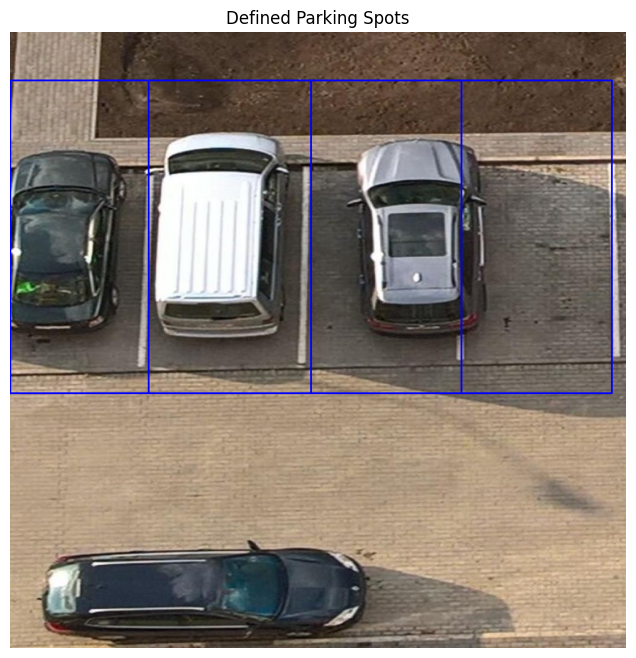


Car 1 Bounding Box: 557,164,802,514
  Parking Spot 1: 0,80,230,600
  Parking Spot 2: 230,80,500,600
  Parking Spot 3: 500,80,750,600
  Parking Spot 4: 750,80,1000,600
  Result: Violation


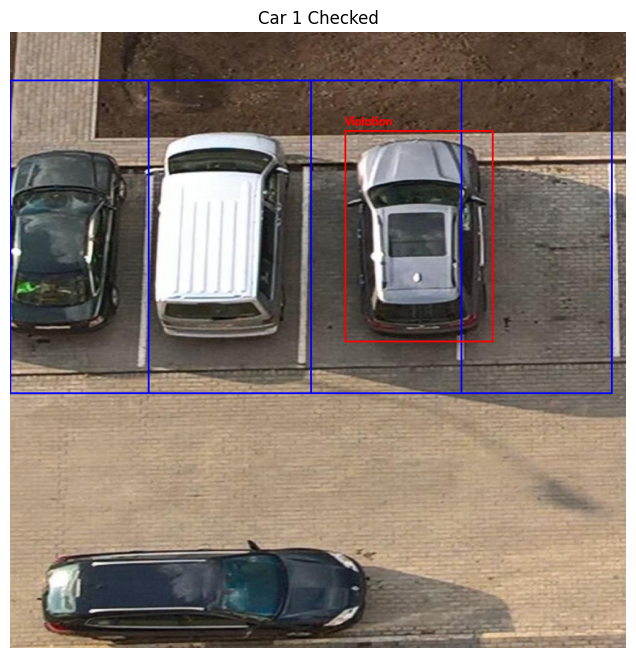


Car 2 Bounding Box: 0,179,200,512
  Parking Spot 1: 0,80,230,600
  Result: OK


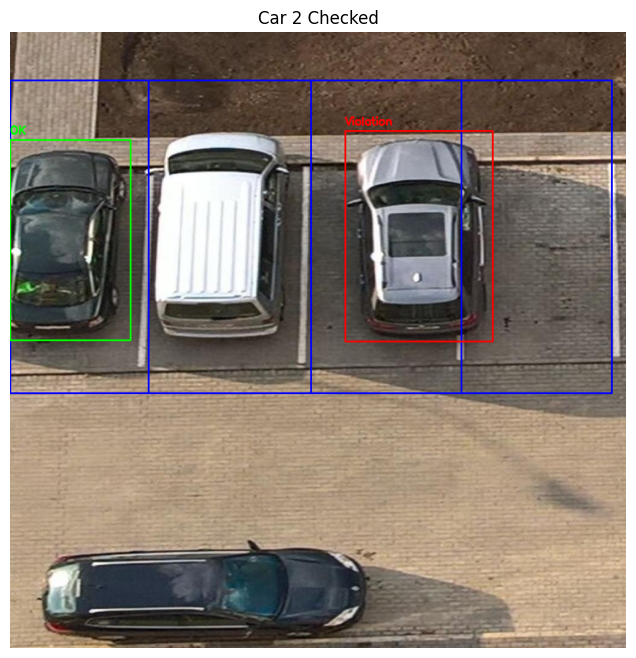


Car 3 Bounding Box: 208,147,479,542
  Parking Spot 1: 0,80,230,600
  Parking Spot 2: 230,80,500,600
  Parking Spot 3: 500,80,750,600
  Parking Spot 4: 750,80,1000,600
  Result: Violation


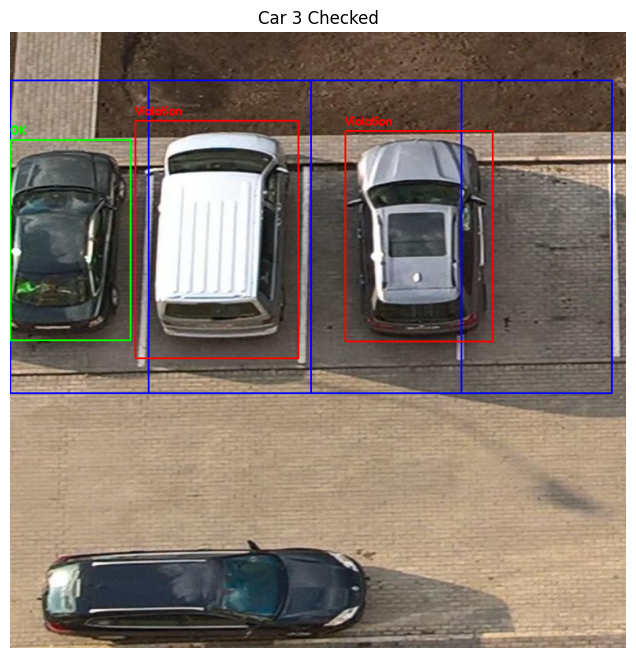


Car 4 Bounding Box: 9,833,619,1019
  Parking Spot 1: 0,80,230,600
  Parking Spot 2: 230,80,500,600
  Parking Spot 3: 500,80,750,600
  Parking Spot 4: 750,80,1000,600
  Result: Violation


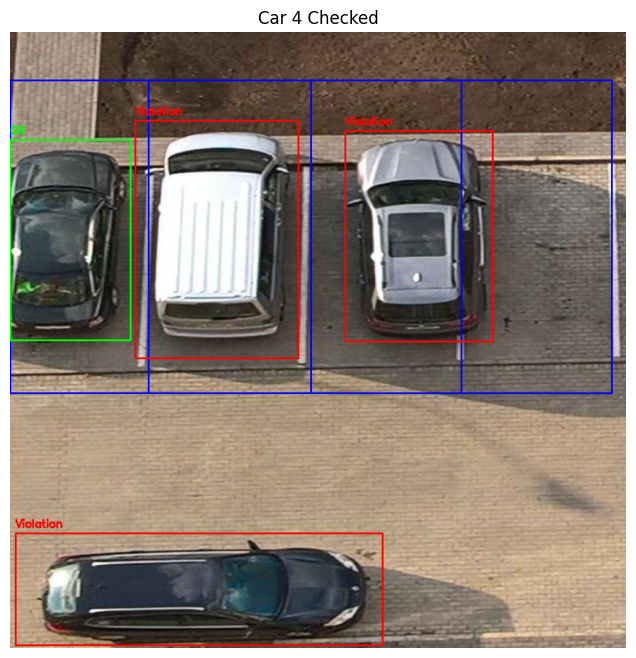

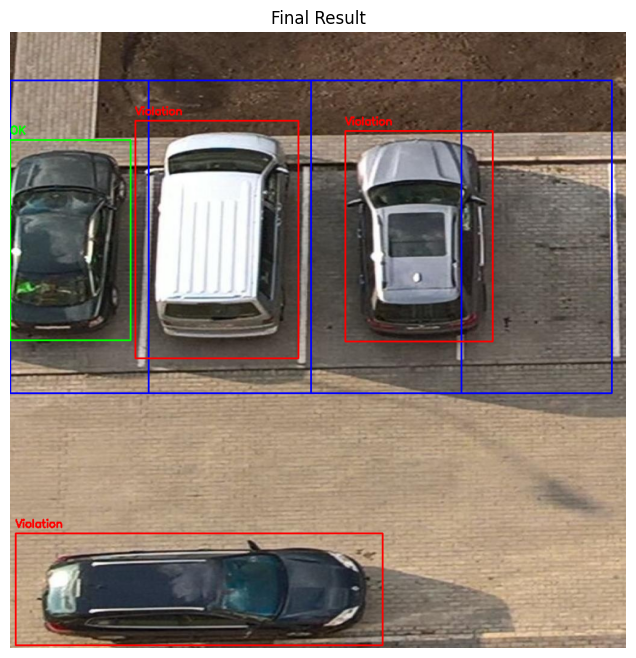

In [43]:
# Intersection over Box
def intersection_over_area(box, rect):
    x1 = max(box[0], rect[0])
    y1 = max(box[1], rect[1])
    x2 = min(box[2], rect[2])
    y2 = min(box[3], rect[3])
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box_area = (box[2] - box[0]) * (box[3] - box[1])
    return 0 if box_area == 0 else inter_area / box_area

# Shrink bounding box around center
def shrink_box(box, shrink_ratio=0.30):
    x1, y1, x2, y2 = map(int, box)
    w = x2 - x1
    h = y2 - y1
    x1_new = x1 + int(w * shrink_ratio / 2)
    y1_new = y1 + int(h * shrink_ratio / 2)
    x2_new = x2 - int(w * shrink_ratio / 2)
    y2_new = y2 - int(h * shrink_ratio / 2)
    return [x1_new, y1_new, x2_new, y2_new]



# إحداثيات المواقف 
def get_parking_spots(img, draw=True):
    img_copy = img.copy()
    parking_rects = [
        [0, 80, 230, 600],     # الموقف 1
        [230, 80, 500, 600],   # الموقف 2
        [500, 80, 750, 600],   # الموقف 3
        [750, 80, 1000, 600],  # الموقف 4
    ]


    if draw:
        for (x1, y1, x2, y2) in parking_rects:
            cv2.rectangle(img_copy, (x1, y1), (x2, y2), (255, 0, 0), 2)

        plt.figure(figsize=(12,8))
        plt.imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
        plt.title("Defined Parking Spots")
        plt.axis("off")
        plt.show()

    return parking_rects, img_copy


# Check violations with ratio
def check_violations_ratio(img, car_boxes, parking_rects, threshold=0.8, shrink_ratio=0.15, show_steps=True):
    img_step = img.copy()
    for i, box in enumerate(car_boxes):
        box_shrink = shrink_box(box, shrink_ratio)  # shrink box
        x1, y1, x2, y2 = map(int, box_shrink)
        violation = True

        for rect in parking_rects:
            inter_area = intersection_over_area(box_shrink, rect) * ((x2-x1)*(y2-y1))
            car_area = (x2 - x1) * (y2 - y1)
            ratio = inter_area / car_area

            if ratio >= threshold:
                violation = False
                break

        label = "Violation" if violation else "OK"
        color = (0, 0, 255) if violation else (0, 255, 0)
        cv2.rectangle(img_step, (x1, y1), (x2, y2), color, 2)
        cv2.putText(img_step, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        if show_steps:
            plt.figure(figsize=(10, 8))
            plt.imshow(cv2.cvtColor(img_step, cv2.COLOR_BGR2RGB))
            plt.title(f"Car {i+1} Checked")
            plt.axis("off")
            plt.show()

    return img_step


if __name__ == "__main__":
    image_path = "testImg.jpg"
    img = cv2.imread(image_path)
    img_copy = img.copy()

    #  Detect cars 
    transform = transforms.ToTensor()
    input_tensor = transform(img_copy).unsqueeze(0).to(device)
    with torch.no_grad():
        outputs = model(input_tensor)[0]

    boxes = outputs["boxes"].detach().cpu().numpy()
    scores = outputs["scores"].detach().cpu().numpy()
    car_boxes = [box for box, score in zip(boxes, scores) if score > 0.5]

    #  Parking spots (manual)
    parking_rects, img_with_spots = get_parking_spots(img_copy, draw=True)

    #  Check violations
    final_img = check_violations_verbose(img_with_spots, car_boxes, parking_rects, show_steps=True)

    
    plt.figure(figsize=(12,8))
    plt.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))
    plt.title("Final Result")
    plt.axis("off")
    plt.show()




### **Parking Detection Methods**

* **Segmentation:**

  * I convert the image to grayscale and apply thresholding and morphological operations.
  * I check violations using intersection over area.

* **Hough Lines Detection:**

  * I use edge detection and Hough transform to detect parking lines.
  * Spots are defined from vertical and horizontal lines.

* **Manual Parking Definition:**

  * I define spots manually

All methods are not perfect, but in our case, the best solution is to use manual coordinate definition, as it is the most accurate and reliable.